Task A

In [ ]:
def list_directory_structure(base_path):
    for root, dirs, files in os.walk(base_path):
        print(f"Root: {root}")
        for file in files:
            if file.endswith(('.wav', '.xlsx', '.txt')):
                print(f"  File: {file}")

# Set the dataset path
base_path = "D:/Projects2.0/SU/UrbanSound8K"
list_directory_structure(base_path)


Required Import Libraries

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import stft, windows
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import librosa
import librosa.display
from collections import defaultdict
import random

Identifying all the Audio files

In [4]:
def get_audio_file_paths(base_path):
    audio_files = []
    metadata_files = []
    for root, dirs, files in os.walk(base_path):
        for file in files:
            file_path = os.path.join(root, file)
            if file.endswith('.wav'):  # Audio files
                audio_files.append(file_path)
            elif file.endswith(('.xlsx', '.csv', '.txt')):  # Metadata and other files
                metadata_files.append(file_path)
    return audio_files, metadata_files

# Define dataset path
base_path = "D:/Projects2.0/SU/UrbanSound8K"

# Get file paths
audio_files, metadata_files = get_audio_file_paths(base_path)
print(f"Number of audio files: {len(audio_files)}")
print(f"Metadata files: {metadata_files}")

Number of audio files: 8732
Metadata files: ['D:/Projects2.0/SU/UrbanSound8K\\FREESOUNDCREDITS.txt', 'D:/Projects2.0/SU/UrbanSound8K\\UrbanSound8K_README.txt', 'D:/Projects2.0/SU/UrbanSound8K\\metadata\\UrbanSound8K.csv']


Batch Processing by Folds

In [5]:
def group_files_by_fold(audio_files):
    folds = defaultdict(list)
    for file_path in audio_files:
        # Extract fold name (assumes directory structure has 'foldX' as parent of files)
        fold_name = os.path.basename(os.path.dirname(file_path))
        folds[fold_name].append(file_path)
    return folds

# Group audio files by fold
audio_folds = group_files_by_fold(audio_files)
for fold, files in audio_folds.items():
    print(f"{fold}: {len(files)} files")

fold1: 873 files
fold10: 837 files
fold2: 888 files
fold3: 925 files
fold4: 990 files
fold5: 936 files
fold6: 823 files
fold7: 838 files
fold8: 806 files
fold9: 816 files


Smart Spectrogram Processing

Processing fold1 with 873 files


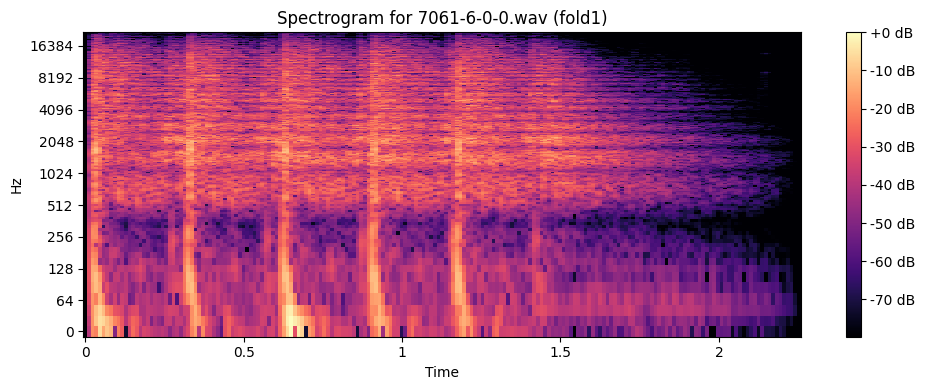

Processing fold10 with 837 files


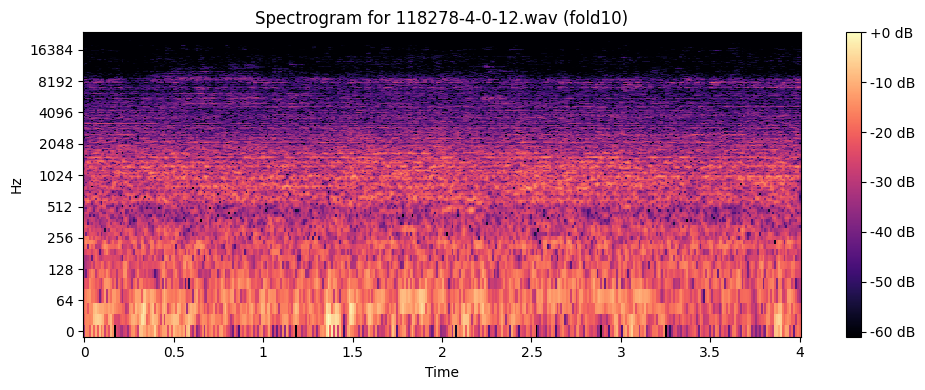

Processing fold2 with 888 files


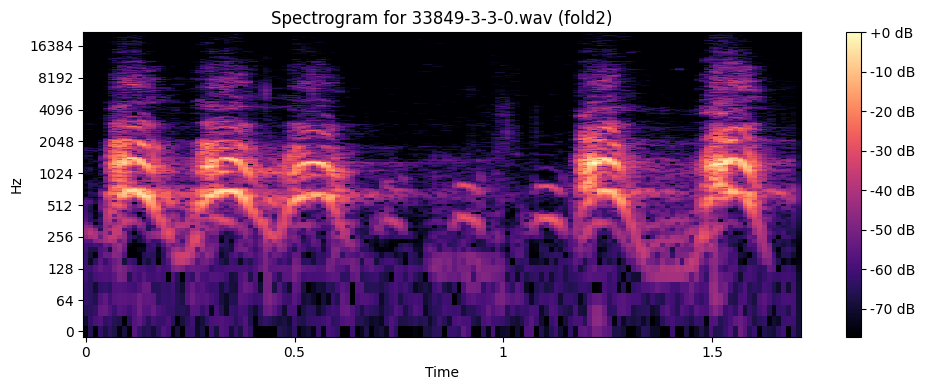

Processing fold3 with 925 files


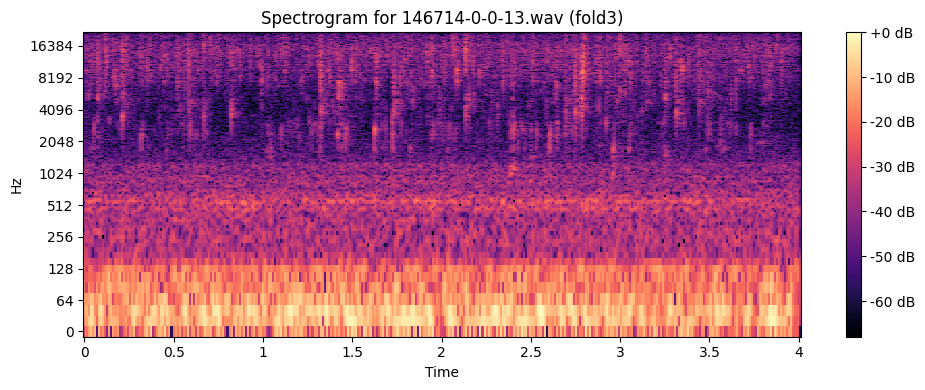

Processing fold4 with 990 files


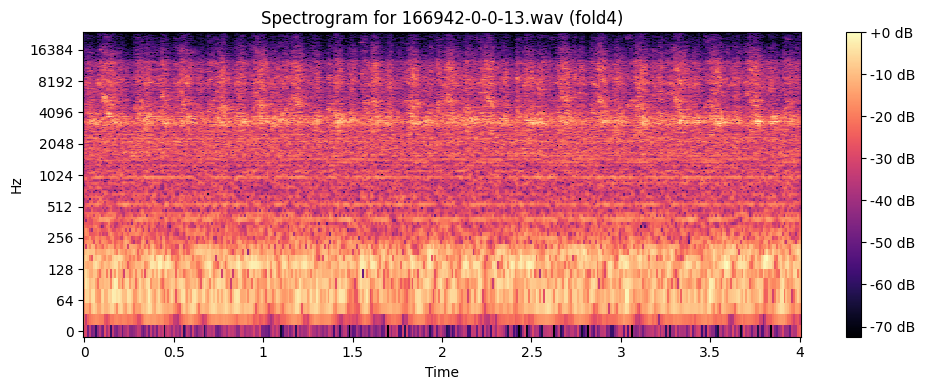

Processing fold5 with 936 files


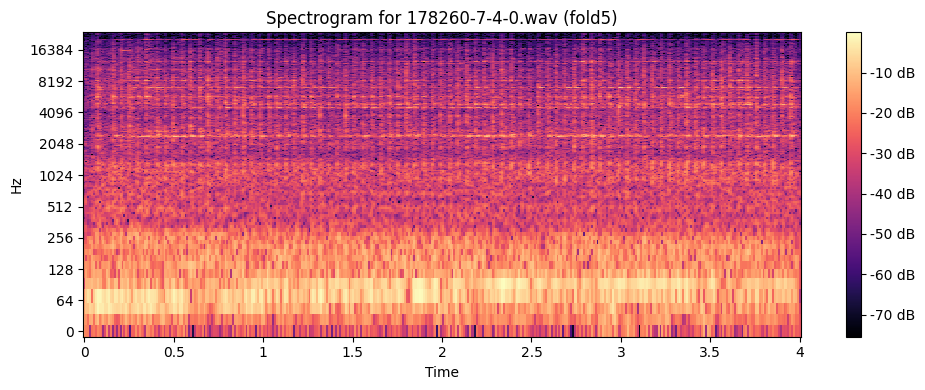

Processing fold6 with 823 files


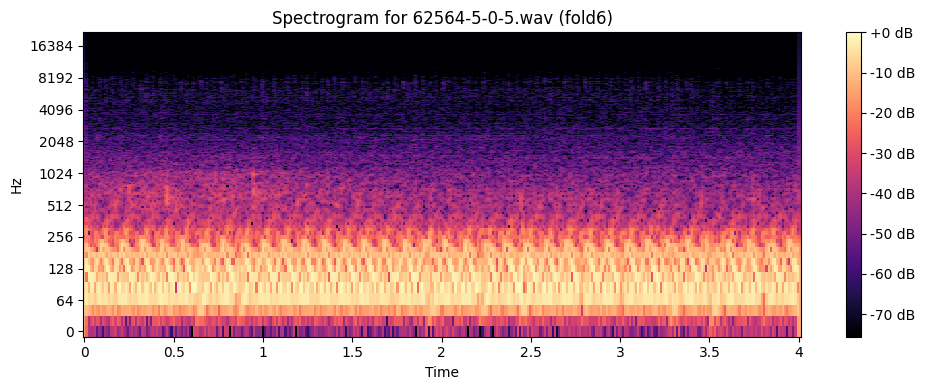

Processing fold7 with 838 files


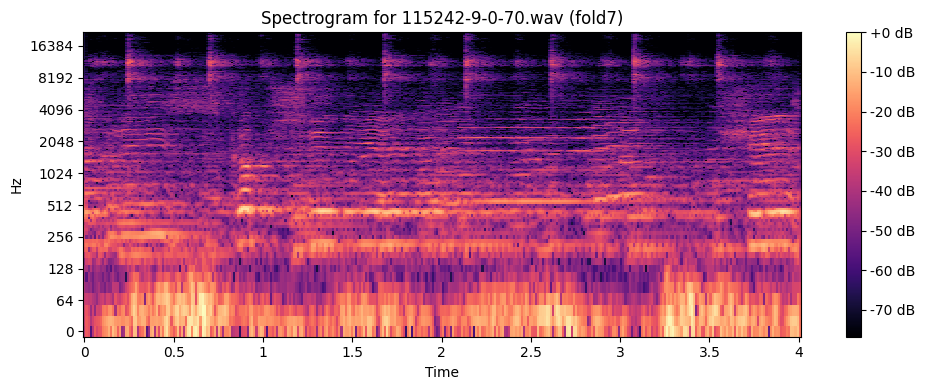

Processing fold8 with 806 files


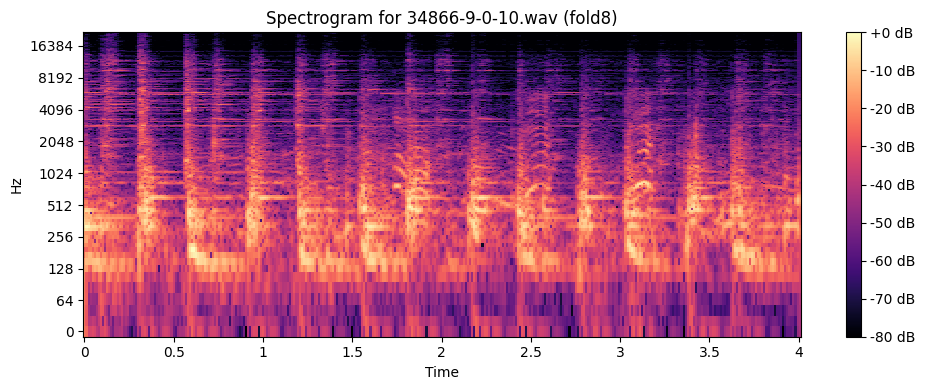

Processing fold9 with 816 files


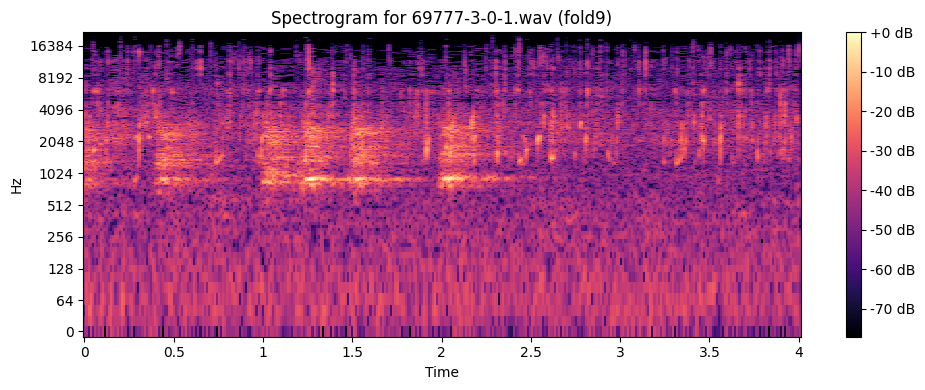

In [6]:
def generate_spectrogram(audio_path, window_type, n_fft=2048, hop_length=512):
    """
    Generate spectrogram using Short-Time Fourier Transform (STFT).

    Parameters:
    - audio_path: str, path to the audio file.
    - window_type: str, type of window (e.g., 'hann', 'hamming', 'boxcar (rectangular)').
    - n_fft: int, FFT size.
    - hop_length: int, number of samples between successive frames.

    Returns:
    - spectrogram: ndarray, magnitude of STFT.
    - sr: int, sampling rate of the audio file.
    """
    y, sr = librosa.load(audio_path, sr=None)
    window = getattr(windows, window_type)(n_fft)
    _, _, Zxx = stft(y, nperseg=n_fft, noverlap=n_fft - hop_length, window=window)
    spectrogram = np.abs(Zxx)
    return spectrogram, sr

def process_fold(fold_name, file_paths):
    """
    Process random 30 audio files in a given fold by generating spectrograms.

    Parameters:
    - fold_name: str, name of the fold.
    - file_paths: list, paths to audio files in the fold.
    """
    print(f"Processing {fold_name} with {len(file_paths)} files")

    sampled_files = random.sample(file_paths, min(1, len(file_paths)))

    for file_path in sampled_files:
        try:
            # Generate and analyze spectrogram
            spectrogram, sr = generate_spectrogram(file_path, 'hann')

            # Plot spectrogram for debugging or visualization (optional)
            plt.figure(figsize=(10, 4))
            librosa.display.specshow(librosa.amplitude_to_db(spectrogram, ref=np.max), sr=sr, x_axis='time', y_axis='log')
            plt.title(f"Spectrogram for {os.path.basename(file_path)} ({fold_name})")
            plt.colorbar(format='%+2.0f dB')
            plt.tight_layout()
            plt.show()

        except Exception as e:
            print(f"Error processing {file_path}: {e}")

def group_files_by_fold(audio_files):
    """
    Group audio files by their fold.

    Parameters:
    - audio_files: list, paths to all audio files.

    Returns:
    - folds: dict, mapping of fold names to lists of file paths.
    """
    folds = defaultdict(list)
    for file_path in audio_files:
        fold_name = os.path.basename(os.path.dirname(file_path))
        folds[fold_name].append(file_path)
    return folds

# Example file paths (replace with your dataset path)
base_path = r"D:/Projects2.0/SU/UrbanSound8K/audio"
audio_files = []
for root, _, files in os.walk(base_path):
    for file in files:
        if file.endswith('.wav'):
            audio_files.append(os.path.join(root, file))

# Group audio files by fold
audio_folds = group_files_by_fold(audio_files)

# Process each fold
for fold_name, file_paths in audio_folds.items():
    process_fold(fold_name, file_paths)


Comparing Windows of each Audio Files of different folds

Processing fold1 with 873 files


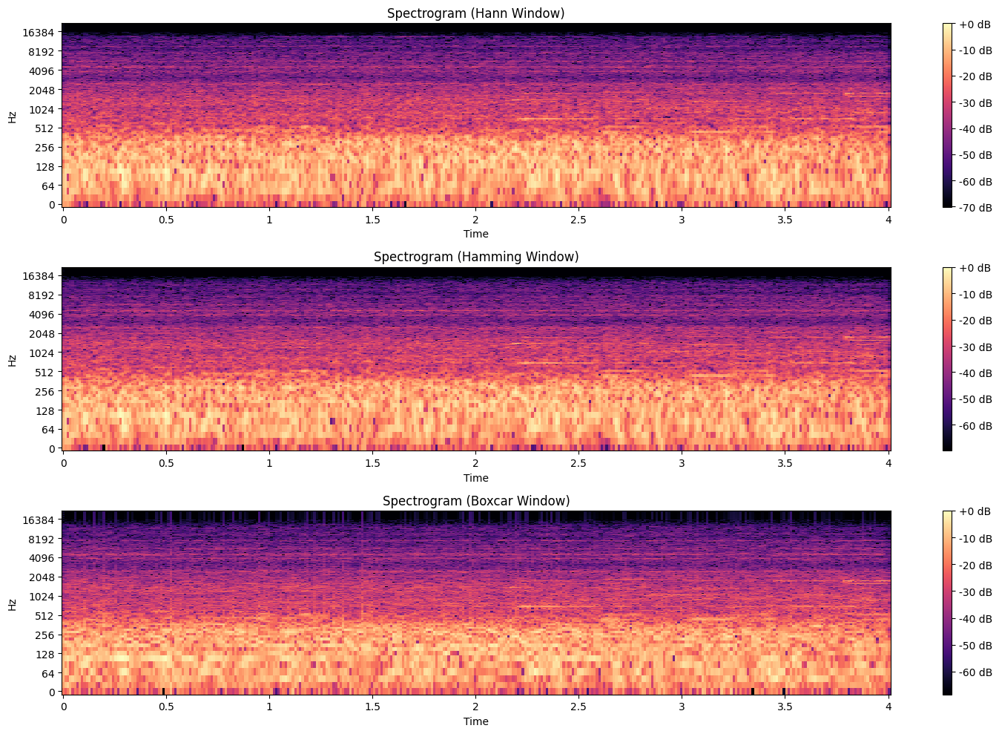

Processing fold10 with 837 files


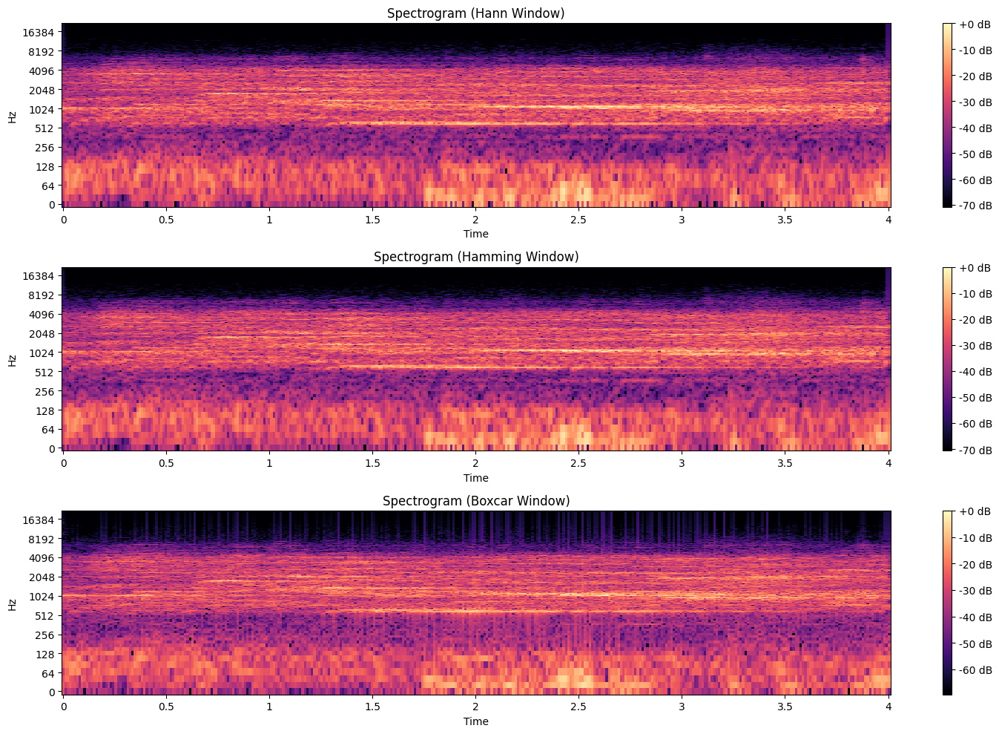

Processing fold2 with 888 files


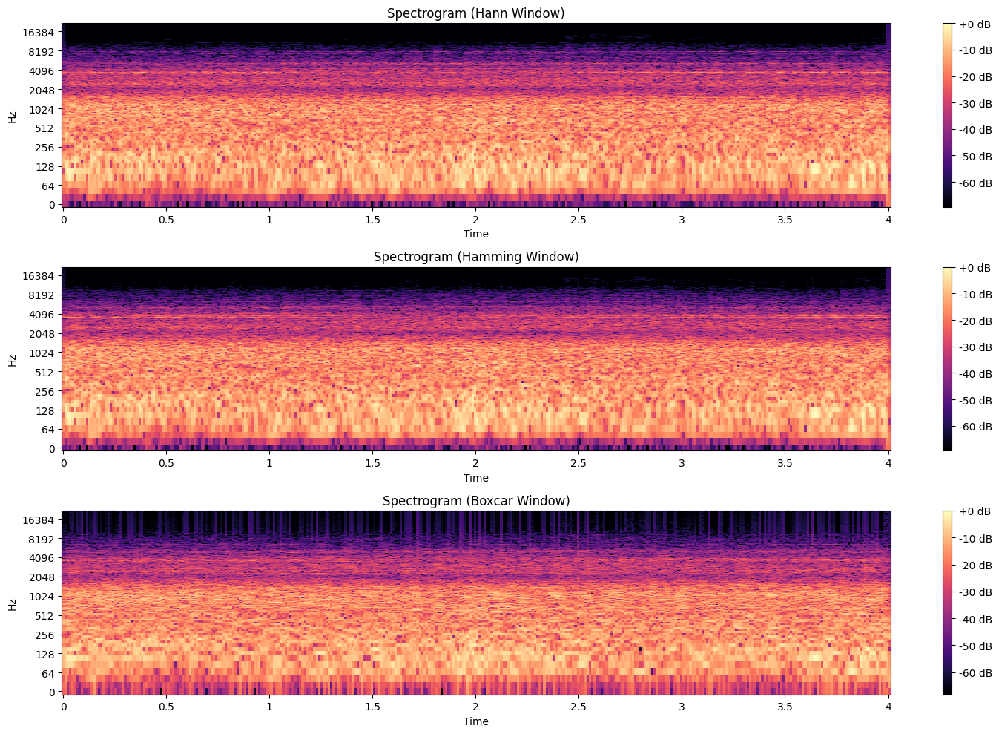

Processing fold3 with 925 files


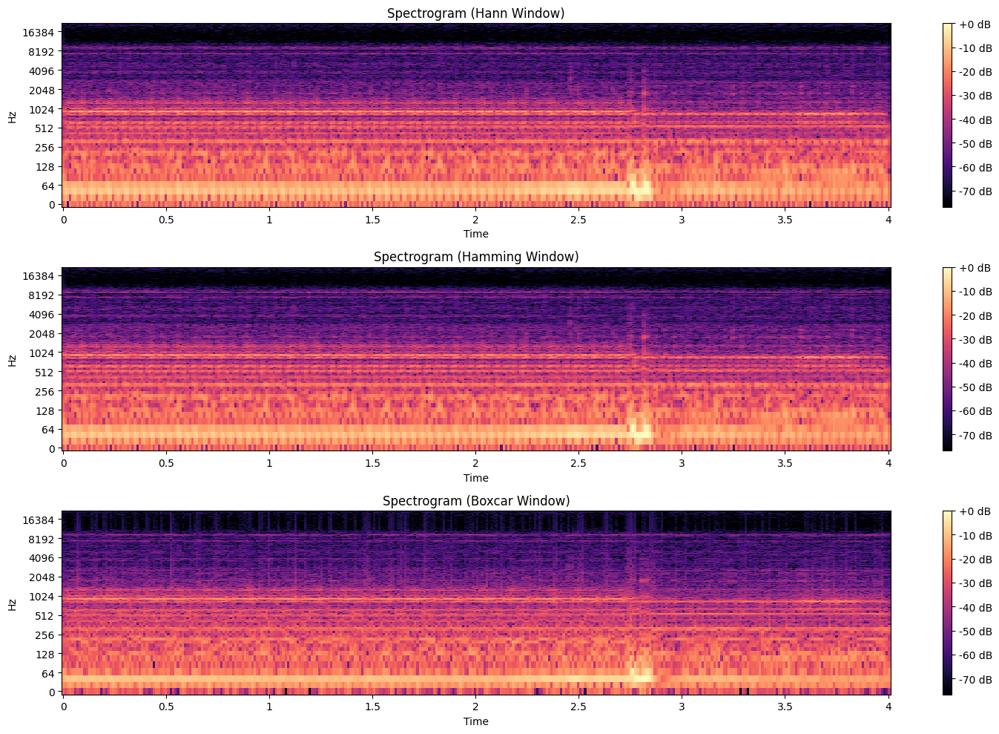

Processing fold4 with 990 files


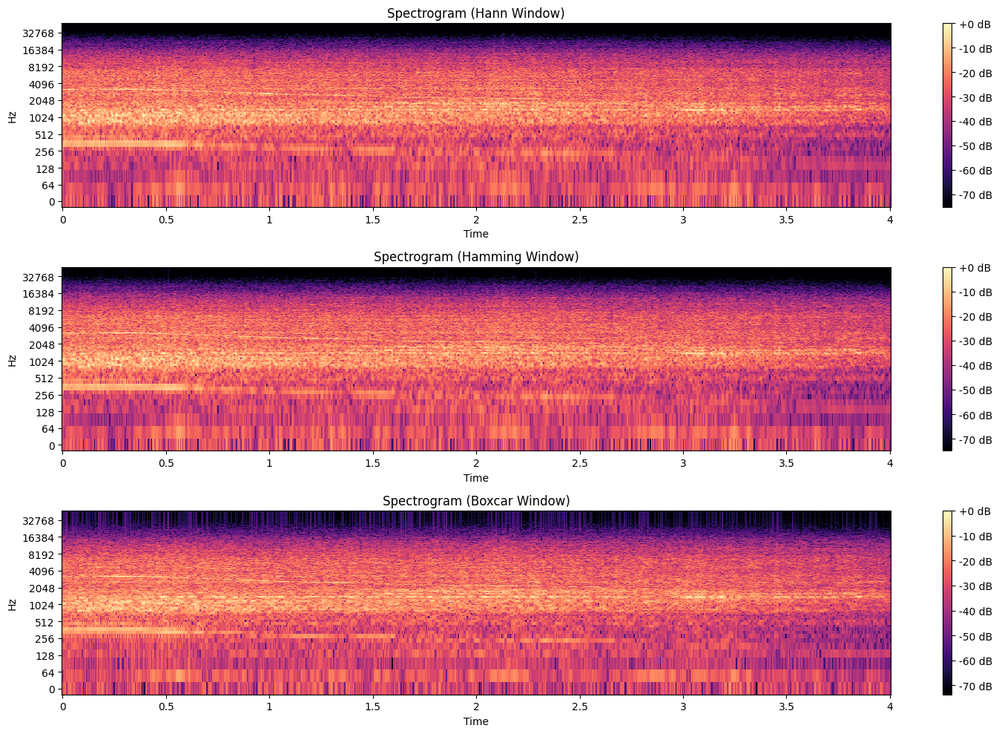

Processing fold5 with 936 files


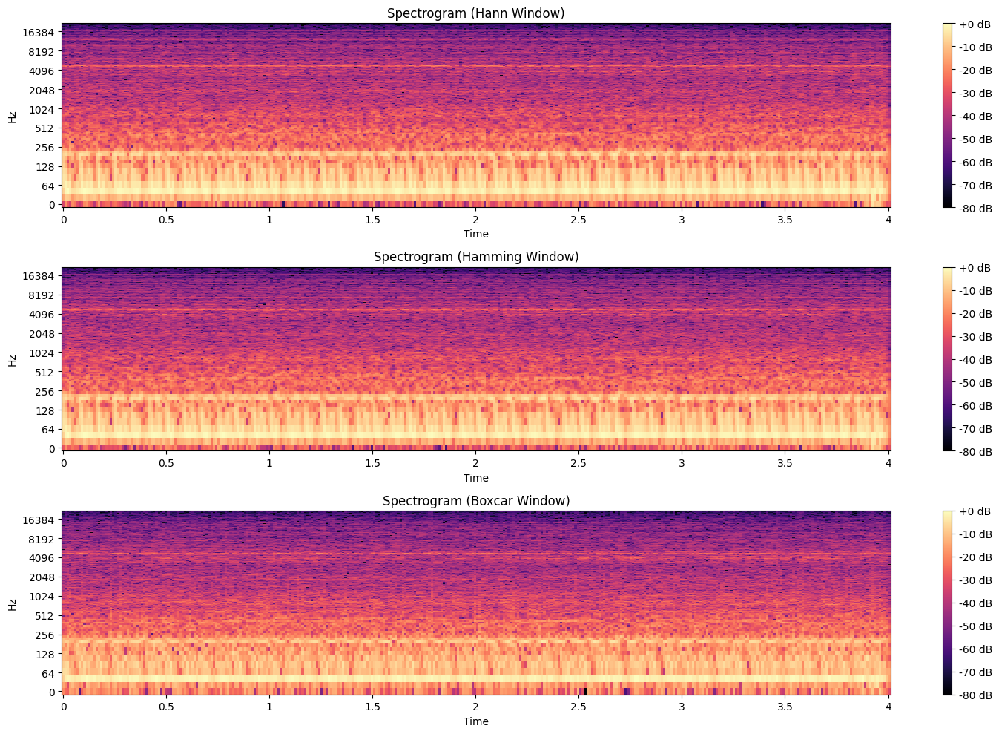

Processing fold6 with 823 files


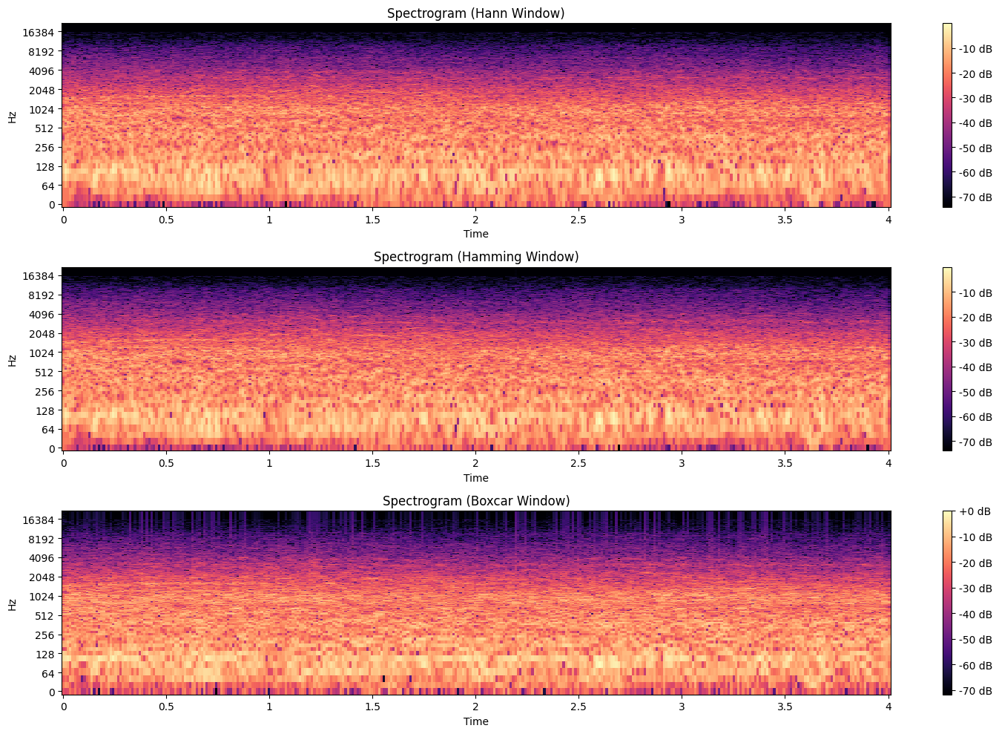

Processing fold7 with 838 files


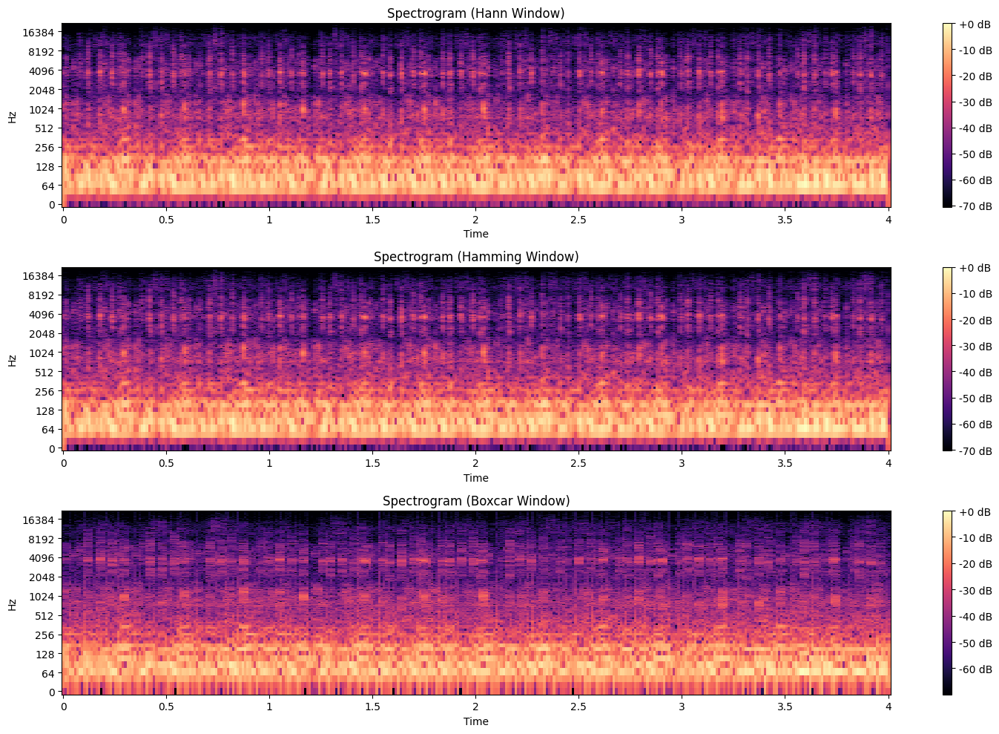

Processing fold8 with 806 files


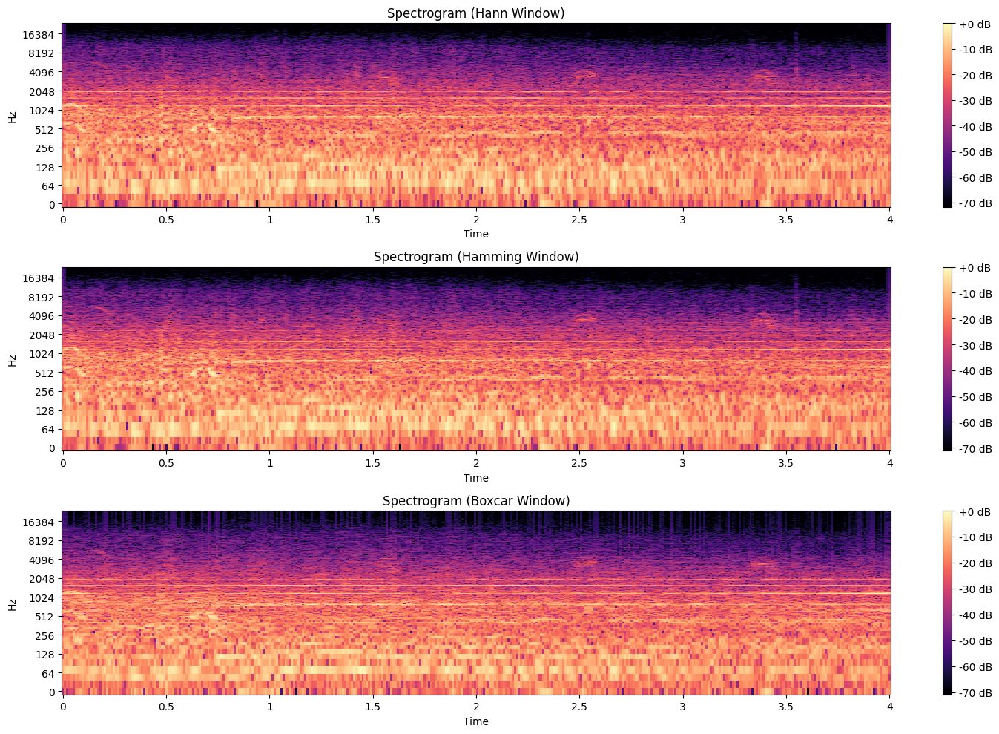

Processing fold9 with 816 files


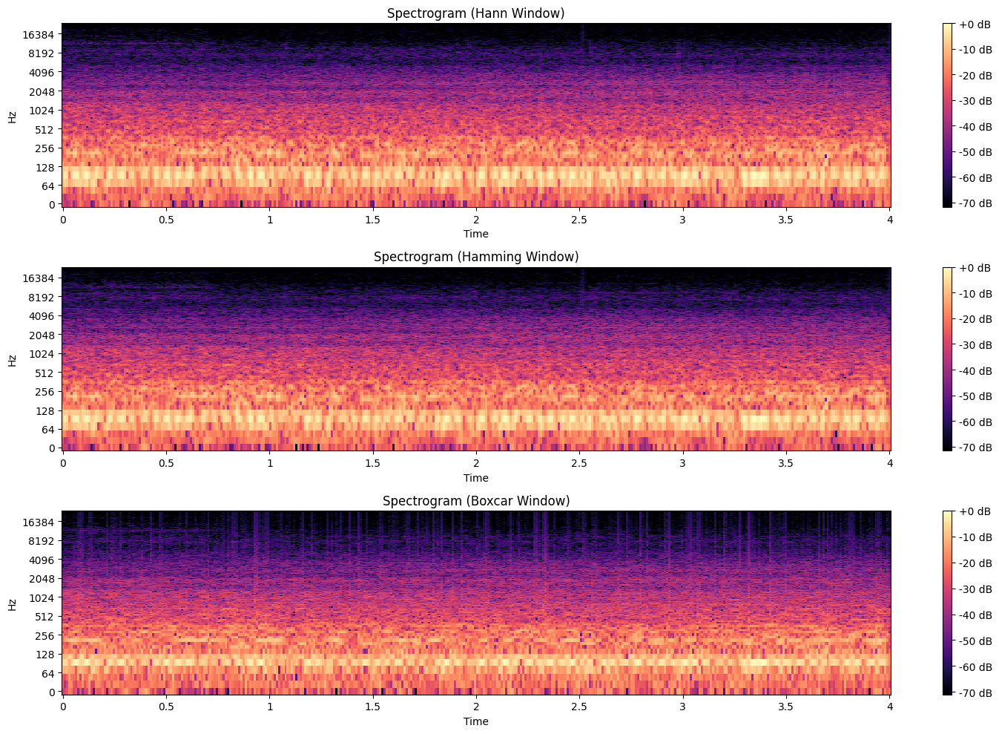

In [7]:
def plot_spectrograms(audio_path):
    """
    Function to plot spectrograms for visual comparison using different window types.

    Parameters:
    - audio_path: str, path to the audio file.
    """
    window_types = ['hann', 'hamming', 'boxcar']
    plt.figure(figsize=(15, 10))
    for i, window_type in enumerate(window_types):
        spectrogram, sr = generate_spectrogram(audio_path, window_type)
        plt.subplot(3, 1, i + 1)
        librosa.display.specshow(librosa.amplitude_to_db(spectrogram, ref=np.max), sr=sr, x_axis='time', y_axis='log')
        plt.title(f"Spectrogram ({window_type.title()} Window)")
        plt.colorbar(format='%+2.0f dB')
    plt.tight_layout()
    plt.show()

def process_fold(fold_name, file_paths):
    """
    Process random 30 audio files in a given fold by generating spectrograms.

    Parameters:
    - fold_name: str, name of the fold.
    - file_paths: list, paths to audio files in the fold.
    """
    print(f"Processing {fold_name} with {len(file_paths)} files")

    # Sample 30 random files from the fold (or all if there are less than 30)
    sampled_files = random.sample(file_paths, min(1, len(file_paths)))

    for file_path in sampled_files:
        try:
            # Generate and analyze spectrograms for comparison
            plot_spectrograms(file_path)

        except Exception as e:
            print(f"Error processing {file_path}: {e}")

def group_files_by_fold(audio_files):
    """
    Group audio files by their fold.

    Parameters:
    - audio_files: list, paths to all audio files.

    Returns:
    - folds: dict, mapping of fold names to lists of file paths.
    """
    from collections import defaultdict
    folds = defaultdict(list)
    for file_path in audio_files:
        fold_name = os.path.basename(os.path.dirname(file_path))
        folds[fold_name].append(file_path)
    return folds

# Example file paths (replace with your dataset path)
base_path = r"D:/Projects2.0/SU/UrbanSound8K/audio"
audio_files = []
for root, _, files in os.walk(base_path):
    for file in files:
        if file.endswith('.wav'):
            audio_files.append(os.path.join(root, file))

# Group audio files by fold
audio_folds = group_files_by_fold(audio_files)

# Process each fold
for fold_name, file_paths in audio_folds.items():
    process_fold(fold_name, file_paths)

Feature Extraction using Spectrogram Mean

In [8]:
# Function to generate spectrogram for audio file
def generate_spectrogram(audio_path, n_fft=2048, hop_length=512):
    y, sr = librosa.load(audio_path, sr=None)
    _, _, Zxx = stft(y, nperseg=n_fft, noverlap=n_fft - hop_length)
    spectrogram = np.abs(Zxx)
    return spectrogram, sr

# Function to extract features and labels from the dataset with random sampling
def extract_features_and_labels_spectrogram(base_path, metadata_path, sample_size=806, n_fft=2048, hop_length=512):
    metadata = pd.read_csv(metadata_path)
    features = []
    labels = []

    for root, _, files in os.walk(base_path):
        wav_files = [file for file in files if file.endswith('.wav')]
        if len(wav_files) < sample_size:
            continue

        sampled_files = random.sample(wav_files, sample_size)

        for file in sampled_files:
            audio_path = os.path.join(root, file)
            try:
                label = metadata[metadata['slice_file_name'] == file]['classID'].values[0]
            except IndexError:
                continue

            spectrogram, _ = generate_spectrogram(audio_path, n_fft, hop_length)
            features.append(np.mean(spectrogram, axis=1))
            labels.append(label)

    return np.array(features), np.array(labels)

# Base path to audio files and metadata file
base_path = "D:/Projects2.0/SU/UrbanSound8K/audio"
metadata_path = "D:/Projects2.0/SU/UrbanSound8K/metadata/UrbanSound8K.csv"

# Extract features and labels
features_spectrogram, labels_spectrogram = extract_features_and_labels_spectrogram(base_path, metadata_path, sample_size=806)

# Standardize the features
scaler = StandardScaler()
features_spectrogram = scaler.fit_transform(features_spectrogram)

# Split the data
X_train_spectrogram, X_test_spectrogram, y_train_spectrogram, y_test_spectrogram = train_test_split(features_spectrogram, labels_spectrogram, test_size=0.2, random_state=42)

print(f"Extracted {len(features_spectrogram)} features and {len(labels_spectrogram)} labels for spectrogram.")

Extracted 8060 features and 8060 labels for spectrogram.


MFCC

In [9]:
# Function to generate MFCC for audio file
def generate_mfcc(audio_path, n_mfcc=13, sr=22050):
    y, sr = librosa.load(audio_path, sr=sr)
    # Dynamically set n_fft based on the length of the audio signal
    n_fft = min(2048, len(y) // 2)
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, n_fft=n_fft)
    return mfcc, sr

# Function to extract features and labels from the dataset with random sampling
def extract_features_and_labels_mfcc(base_path, metadata_path, sample_size=806, n_mfcc=13, sr=22050):
    metadata = pd.read_csv(metadata_path)
    features = []
    labels = []

    for root, _, files in os.walk(base_path):
        wav_files = [file for file in files if file.endswith('.wav')]
        if len(wav_files) < sample_size:
            continue

        sampled_files = random.sample(wav_files, sample_size)

        for file in sampled_files:
            audio_path = os.path.join(root, file)
            try:
                label = metadata[metadata['slice_file_name'] == file]['classID'].values[0]
            except IndexError:
                continue

            mfcc, _ = generate_mfcc(audio_path, n_mfcc, sr)
            features.append(np.mean(mfcc, axis=1))
            labels.append(label)

    return np.array(features), np.array(labels)

# Base path to audio files and metadata file
base_path = "D:/Projects2.0/SU/UrbanSound8K/audio"
metadata_path = "D:/Projects2.0/SU/UrbanSound8K/metadata/UrbanSound8K.csv"

# Extract features and labels
features_mfcc, labels_mfcc = extract_features_and_labels_mfcc(base_path, metadata_path, sample_size=806, n_mfcc=13, sr=22050)

# Standardize the features
scaler = StandardScaler()
features_mfcc = scaler.fit_transform(features_mfcc)

# Split the data
X_train_mfcc, X_test_mfcc, y_train_mfcc, y_test_mfcc = train_test_split(features_mfcc, labels_mfcc, test_size=0.2, random_state=42)

print(f"Extracted {len(features_mfcc)} features and {len(labels_mfcc)} labels for MFCC.")

Extracted 8060 features and 8060 labels for MFCC.


Log-Mel Spectrogram

In [10]:
# Function to generate log-mel spectrogram for audio file
def generate_log_mel_spectrogram(audio_path, n_mels=128, sr=22050, n_fft=2048, hop_length=512):
    y, sr = librosa.load(audio_path, sr=sr)
    # Dynamically adjust n_fft based on the length of the audio signal
    n_fft = min(n_fft, len(y) // 2)
    mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=n_mels, n_fft=n_fft, hop_length=hop_length)
    log_mel_spectrogram = librosa.power_to_db(mel_spectrogram)
    return log_mel_spectrogram, sr

# Function to extract features and labels from the dataset with random sampling
def extract_features_and_labels_log_mel(base_path, metadata_path, sample_size=806, n_mels=128, sr=22050, n_fft=2048, hop_length=512):
    metadata = pd.read_csv(metadata_path)
    features = []
    labels = []

    for root, _, files in os.walk(base_path):
        wav_files = [file for file in files if file.endswith('.wav')]
        if len(wav_files) < sample_size:
            continue

        sampled_files = random.sample(wav_files, min(sample_size, len(wav_files)))

        for file in sampled_files:
            audio_path = os.path.join(root, file)
            try:
                label = metadata[metadata['slice_file_name'] == file]['classID'].values[0]
            except IndexError:
                continue

            log_mel_spectrogram, _ = generate_log_mel_spectrogram(audio_path, n_mels, sr, n_fft, hop_length)
            features.append(np.mean(log_mel_spectrogram, axis=1))
            labels.append(label)

    return np.array(features), np.array(labels)

# Base path to audio files and metadata file
base_path = "D:/Projects2.0/SU/UrbanSound8K/audio"
metadata_path = "D:/Projects2.0/SU/UrbanSound8K/metadata/UrbanSound8K.csv"

# Extract features and labels
features_log_mel, labels_log_mel = extract_features_and_labels_log_mel(base_path, metadata_path, sample_size=806, n_mels=128, sr=22050, n_fft=2048, hop_length=512)

# Standardize the features
scaler = StandardScaler()
features_log_mel = scaler.fit_transform(features_log_mel)

# Split the data
X_train_log_mel, X_test_log_mel, y_train_log_mel, y_test_log_mel = train_test_split(features_log_mel, labels_log_mel, test_size=0.2, random_state=42)

print(f"Extracted {len(features_log_mel)} features and {len(labels_log_mel)} labels for log-mel spectrogram.")

Extracted 8060 features and 8060 labels for log-mel spectrogram.


Train Using Neural Network

In [12]:
# Define the neural network architecture
class SimpleNN(nn.Module):
    def __init__(self, input_size, num_classes):
        super(SimpleNN, self).__init__()
        self.fc1 = nn.Linear(input_size, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, num_classes)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

# Function to train and evaluate the neural network
def train_and_evaluate_nn(X_train, X_test, y_train, y_test, input_size, num_classes, batch_size=32, epochs=20):
    # Convert data to PyTorch tensors
    X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train, dtype=torch.long)
    X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
    y_test_tensor = torch.tensor(y_test, dtype=torch.long)

    # Create DataLoader for training data
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    # Initialize the model, loss function, and optimizer
    model = SimpleNN(input_size, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Training loop
    model.train()
    for epoch in range(epochs):
        for batch_X, batch_y in train_loader:
            optimizer.zero_grad()
            outputs = model(batch_X)
            loss = criterion(outputs, batch_y)
            loss.backward()
            optimizer.step()

    # Evaluation
    model.eval()
    with torch.no_grad():
        test_outputs = model(X_test_tensor)
        _, predicted = torch.max(test_outputs, 1)
        accuracy = (predicted == y_test_tensor).sum().item() / len(y_test_tensor)

    return accuracy

# Train and evaluate for spectrogram features
input_size_spectrogram = X_train_spectrogram.shape[1]
num_classes = len(np.unique(labels_spectrogram))
acc_spectrogram = train_and_evaluate_nn(X_train_spectrogram, X_test_spectrogram, y_train_spectrogram, y_test_spectrogram, input_size_spectrogram, num_classes)
print(f"Spectrogram Feature Accuracy: {acc_spectrogram * 100:.2f}%")

# Train and evaluate for MFCC features
input_size_mfcc = X_train_mfcc.shape[1]
num_classes = len(np.unique(labels_mfcc))
acc_mfcc = train_and_evaluate_nn(X_train_mfcc, X_test_mfcc, y_train_mfcc, y_test_mfcc, input_size_mfcc, num_classes)
print(f"MFCC Feature Accuracy: {acc_mfcc * 100:.2f}%")

# Train and evaluate for log-mel spectrogram features
input_size_log_mel = X_train_log_mel.shape[1]
num_classes = len(np.unique(labels_log_mel))
acc_log_mel = train_and_evaluate_nn(X_train_log_mel, X_test_log_mel, y_train_log_mel, y_test_log_mel, input_size_log_mel, num_classes)
print(f"Log-Mel Spectrogram Feature Accuracy: {acc_log_mel * 100:.2f}%")

Spectrogram Feature Accuracy: 74.50%
MFCC Feature Accuracy: 79.09%
Log-Mel Spectrogram Feature Accuracy: 82.20%


Task B

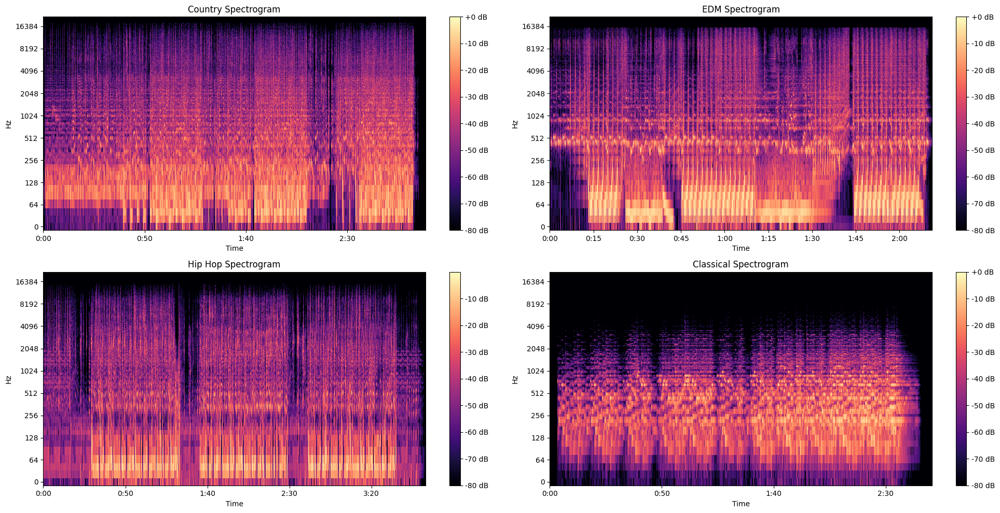

In [3]:
import librosa
import librosa.display
import matplotlib.pyplot as plt

# Define file paths and genres
file_paths = [
    "D:/Projects2.0/SU/Country.wav",
    "D:/Projects2.0/SU/EDM.wav",
    "D:/Projects2.0/SU/HipHop.wav",
    "D:/Projects2.0/SU/Classical.wav"
]
genres = ["Country", "EDM", "Hip Hop", "Classical"]

# Load audio files and generate spectrograms
spectrograms = []
for file_path in file_paths:
    y, sr = librosa.load(file_path, sr=None)
    D = librosa.stft(y)
    spectrogram = librosa.amplitude_to_db(np.abs(D), ref=np.max)
    spectrograms.append(spectrogram)

# Plot spectrograms
plt.figure(figsize=(20, 10))
for i, (spectrogram, genre) in enumerate(zip(spectrograms, genres), 1):
    plt.subplot(2, 2, i)
    librosa.display.specshow(spectrogram, sr=sr, x_axis='time', y_axis='log')
    plt.title(f"{genre} Spectrogram")
    plt.colorbar(format='%+2.0f dB')
plt.tight_layout()
plt.show()